## Mask R-CNN - Dectection

*Sébastien Ohleyer*

Detection notebook.

Python 3

In [2]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import utils
import visualize
from visualize import display_images
import model as modellib
from model import log

%matplotlib inline 

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to trained weights file
AERIAL_MODEL_PATH = "/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/trained_model"

## Configurations

In [3]:
import aerial
config = aerial.AerialConfig()
AERIAL_DIR = "/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/AerialImageDataset/"

In [4]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [ 123.7  116.8  103.9]
MINI_MASK_SHAPE                (1024, 1024)
NAME                           aerial
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_T

## Notebook Preferences

In [5]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [6]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [7]:
# Load dataset val
#TOWN_LIST = ["austin", "chicago", "kitsap", "tyrol-w", "vienna"]
TOWN_LIST = ["chicago"]
IMAGE_PER_TOWN = 1

dataset = aerial.AerialDataset()
dataset.load_aerial(dataset_dir=AERIAL_DIR, subset="val", town_list=TOWN_LIST, image_per_town=IMAGE_PER_TOWN)
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Info: {}".format(dataset.class_info))

Image Count: 1
Class Info: [{'source': '', 'id': 0, 'name': 'BG'}, {'source': 'aerial', 'id': 1, 'name': 'building'}]


In [8]:
[dataset.image_info[i]["image_name"] for i in dataset.image_ids]

['chicago6_00.tif']

## Load Model

In [9]:
# Create model in inference mode
initial_weights = '3_mask_rcnn_aerial_0037.h5'

with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

weights_path = os.path.join(AERIAL_MODEL_PATH, initial_weights)

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/trained_model/3_mask_rcnn_aerial_0037.h5


## Run Detection

image ID: aerial.0 (0) 
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/utils.py:71: RuntimeWarning: invalid value encountered in true_divide
  iou = intersection / union
/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/utils.py:124: RuntimeWarning: invalid value encountered in greater
  remove_ixs = np.where(iou > threshold)[0] + 1
/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/model.py:2274: RuntimeWarning: divide by zero encountered in long_scalars
  h_scale = image_shape[0] / (window[2] - window[0])
/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/model.py:2275: RuntimeWarning: divide by zero encountered in long_scalars
  w_scale = image_shape[1] / (window[3] - window[1])
/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/model.py:2282: RuntimeWarning: invalid value encountered in multiply
  boxes = np.multiply(boxes - shifts, scales).astype(np.int32)



*** No instances to display *** 

gt_class_id              shape: (259,)                min:    1.00000  max:    1.00000
gt_bbox                  shape: (259, 4)              min:    0.00000  max: 1024.00000
gt_mask                  shape: (1024, 1024, 259)     min:    0.00000  max:    1.00000


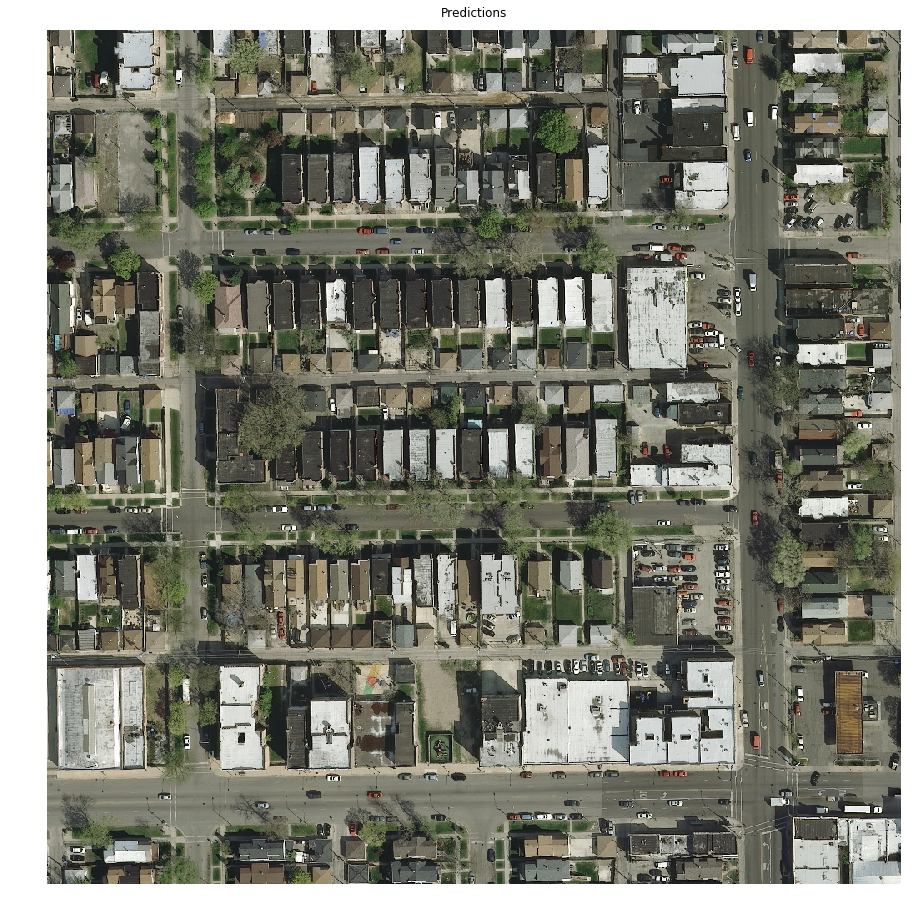

In [10]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

## Step by step prediction

### 1.a RPN Target

In [11]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000
target_rpn_bbox          shape: (256, 4)              min:   -7.54862  max:    2.98311
positive_anchors         shape: (128, 4)              min:  -16.00000  max: 1037.25483
negative_anchors         shape: (128, 4)              min:  -24.00000  max: 1066.50967
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867
refined_anchors          shape: (128, 4)              min:    0.00000  max: 1024.00000


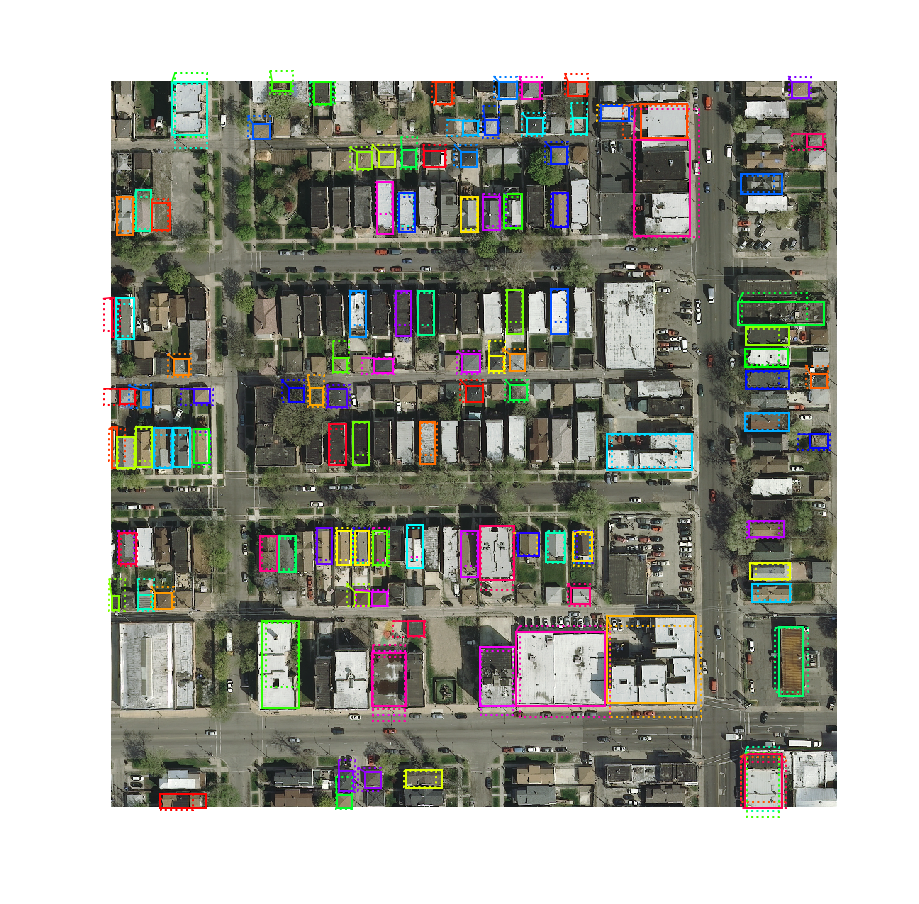

In [12]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

In [13]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 introduces a new version of NMS. Search for both names to support TF 1.3 and 1.4
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00001  max:    0.99999
pre_nms_anchors          shape: (1, 6000, 4)          min:  -53.01934  max: 1066.50964
refined_anchors          shape: (1, 6000, 4)          min:  -38.13509  max: 1039.81580
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max: 1024.00000
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 4266.00000
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000


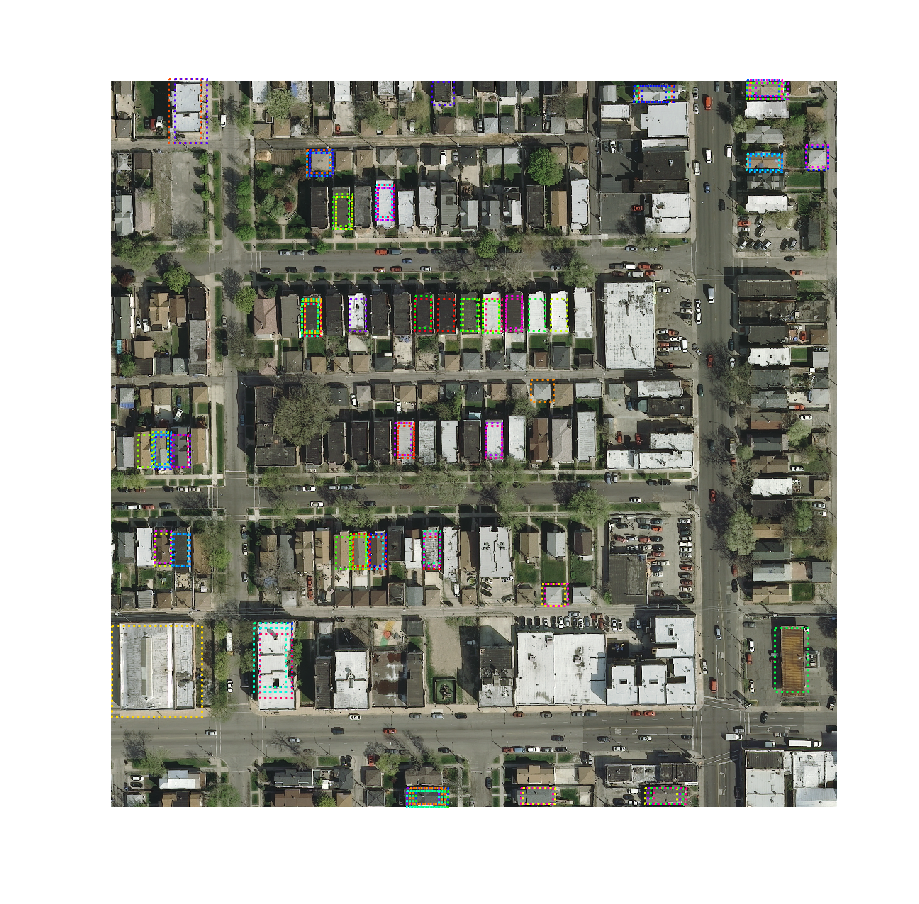

In [14]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

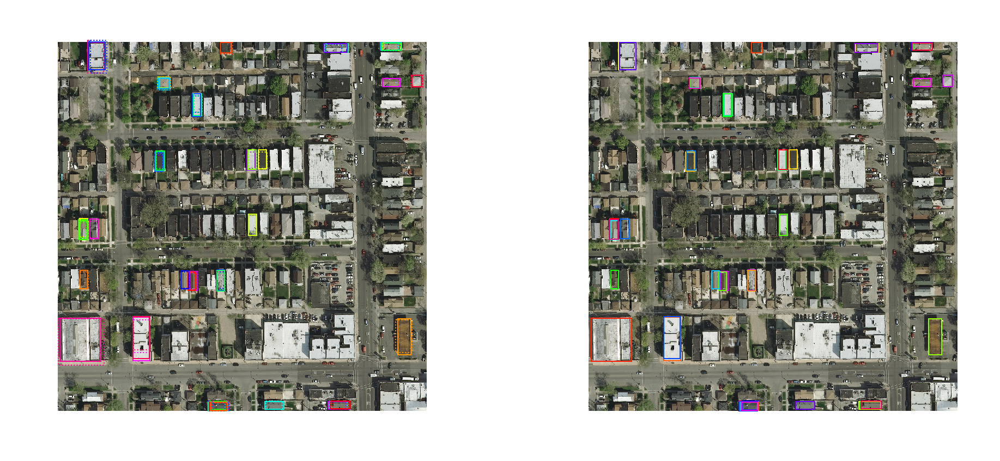

In [15]:
# Show top anchors with refinment. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
visualize.draw_boxes(image, boxes=rpn["pre_nms_anchors"][0, :limit], 
           refined_boxes=rpn["refined_anchors"][0, :limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, :limit], ax=ax[1])

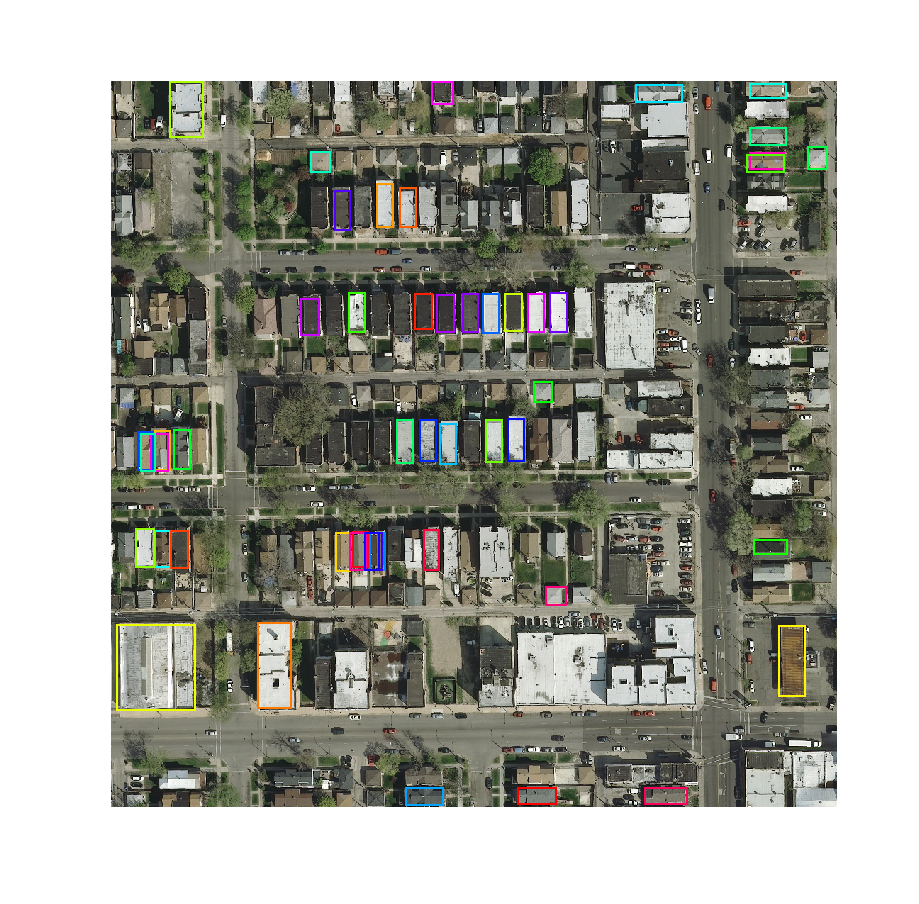

In [16]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, ixs], ax=get_ax())

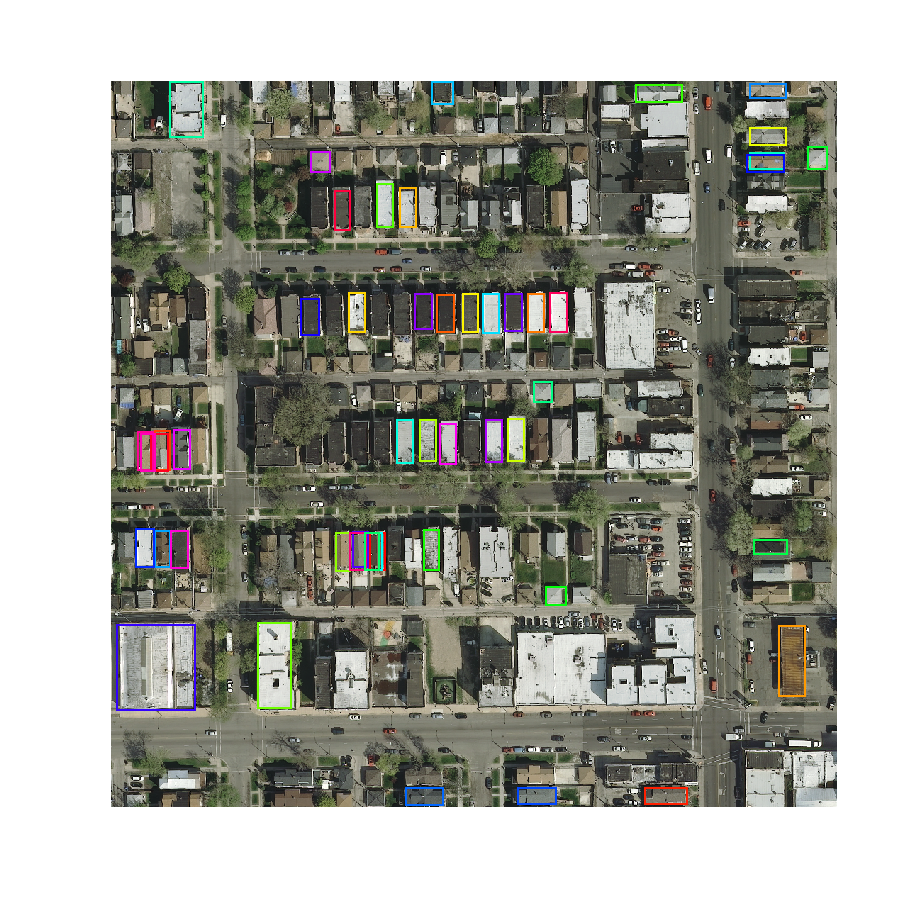

In [17]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [18]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))



All Anchors (261888)       Recall: 0.251  Positive anchors: 224
Refined Anchors ( 6000)   Recall: 0.737  Positive anchors: 1512
Post NMS Anchors (   50)  Recall: 0.112  Positive anchors: 29


## Stage 2: Proposal Classification

### 2.a Proposal Classification

In [94]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/utils.py:71: RuntimeWarning: invalid value encountered in true_divide
  iou = intersection / union
/Users/sebastienohleyer/Documents/ENS MVA/Object recognition/mask_rcnn/code/utils.py:124: RuntimeWarning: invalid value encountered in greater
  remove_ixs = np.where(iou > threshold)[0] + 1


proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000
probs                    shape: (1, 1000, 2)          min:    0.00770  max:    0.99230
deltas                   shape: (1, 1000, 2, 4)       min:   -2.70730  max:    2.51760
masks                    shape: (1, 100, 28, 28, 2)   min:    0.07057  max:    0.64935
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000


In [105]:
mrcnn['detections']

array([[[ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.93013   ],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.91488999],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.91434121],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.90862238],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.9042775 ],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.90340793],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.90177375],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.88176864],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.87922949],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
          0.8710115 ],
        [ 0.        ,  0.     

100 detections: ['building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' '

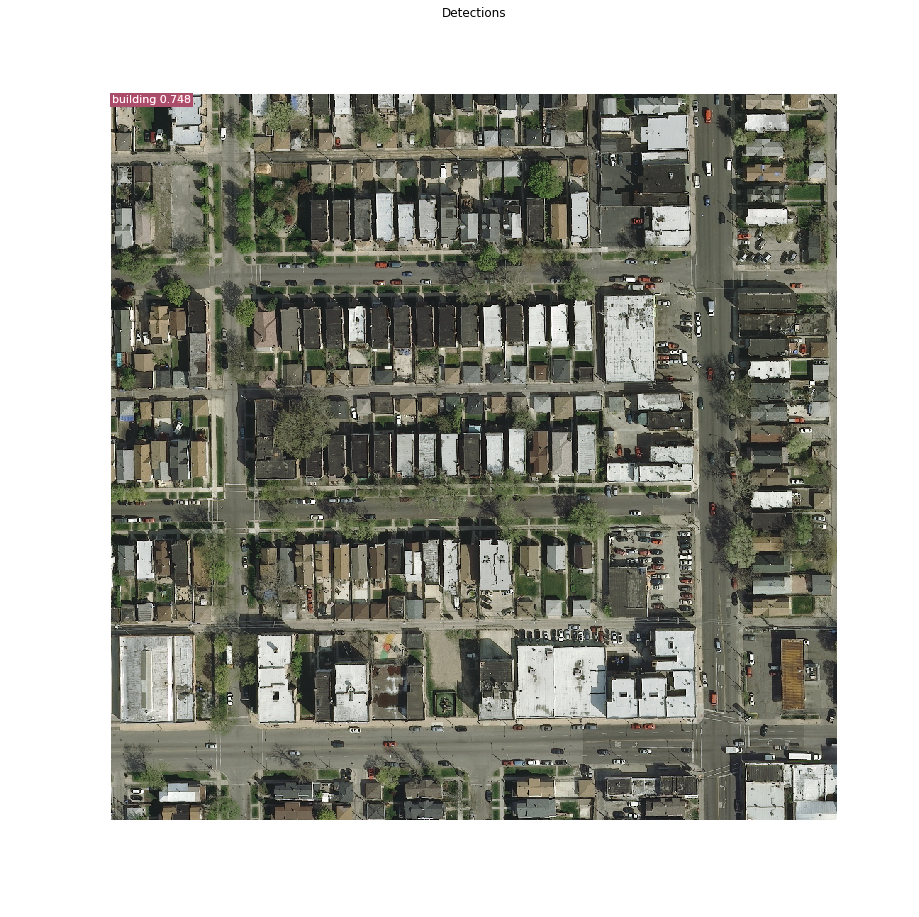

In [93]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
#det_count = np.where(det_class_ids == 0)[0][0]
det_count = len(det_class_ids)
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=detections[:, :4],
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

In [104]:
detections.shape

(100, 6)

### 2.c Step by Step Detection

In [23]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
511 Positive ROIs
[('BG', 489), ('building', 511)]


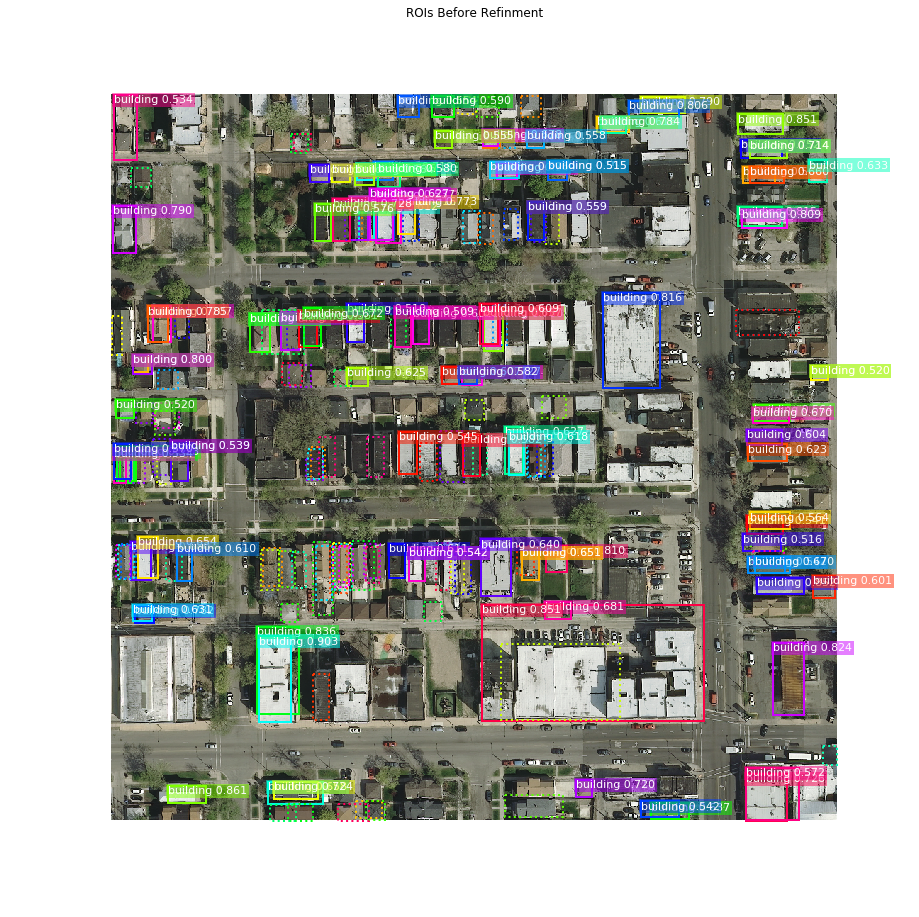

In [24]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinment",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -2.70730  max:    2.09509
refined_proposals        shape: (1000, 4)             min:  -13.00000  max: 1027.00000


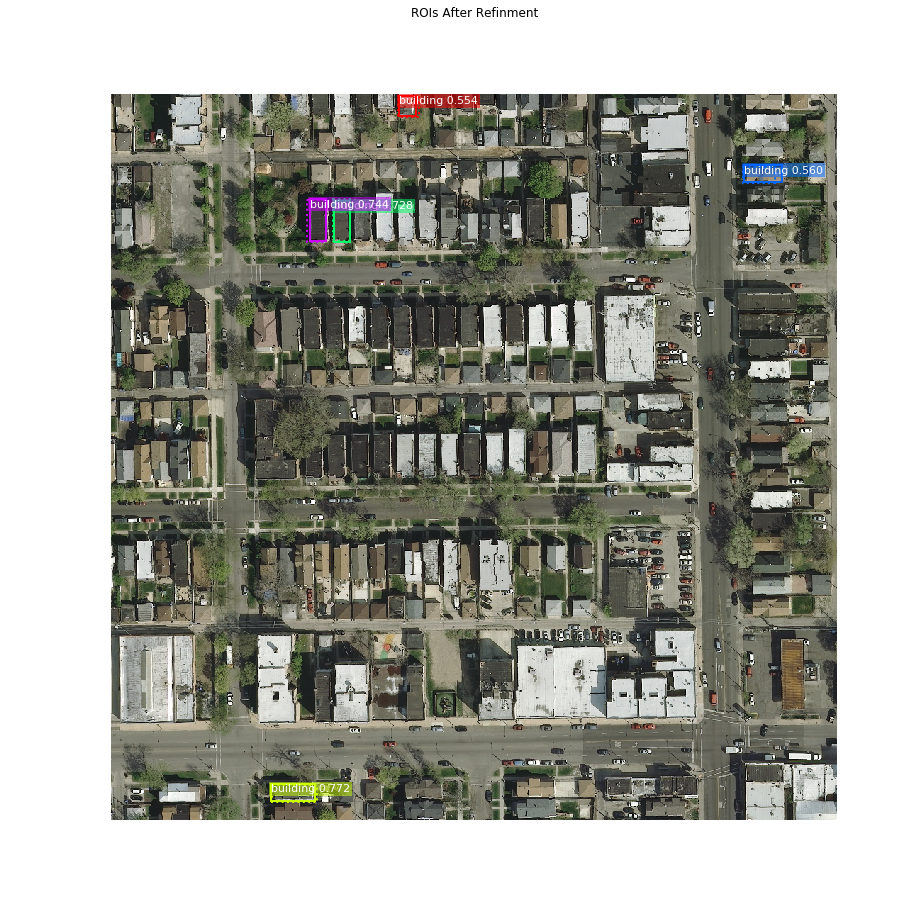

In [25]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinment",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [26]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 511 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  17  18
  19  20  21  22  23  24  26  27  28  29  30  31  32  33  34  35  36  37
  38  39  40  41  42  43  44  45  46  47  50  51  52  53  55  56  58  59
  61  62  63  64  65  66  67  68  69  71  72  73  74  75  76  77  78  79
  80  81  82  84  85  86  88  89  91  92  93  94  95  96  97  98 100 101
 106 107 108 109 110 111 112 113 114 115 116 119 120 122 123 124 126 127
 128 130 133 134 135 136 137 138 140 141 142 143 144 145 146 147 148 151
 152 153 156 157 158 159 160 161 162 163 164 165 166 167 168 172 175 177
 178 179 180 181 182 183 186 189 191 192 193 195 196 197 199 200 201 202
 203 205 207 208 209 210 212 213 214 216 218 220 221 222 224 225 226 230
 233 234 236 237 238 239 240 241 242 243 244 249 250 251 253 254 256 260
 262 264 265 266 267 268 269 270 272 273 274 275 276 278 280 281 284 286
 287 288 291 294 296 299 300 301 304 306 307 308 309 311 312 314 316 319
 320 321 322 324 326 327 328 3

In [27]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.7 confidence. Keep 166:
[  0   1   3   4   5   6   7  14  17  18  19  23  27  28  30  32  36  39
  45  52  55  56  59  64  65  66  67  72  73  75  76  79  84  86  91  92
  93  96  97 109 110 111 112 113 124 134 137 138 140 141 142 143 144 146
 151 152 156 162 165 166 168 172 175 177 180 191 192 193 199 201 213 221
 225 226 239 242 260 268 270 275 276 280 286 287 294 307 314 319 321 324
 334 339 340 345 346 352 356 363 364 374 377 391 401 411 435 439 447 450
 451 452 454 461 466 468 482 494 496 498 500 501 503 504 510 527 534 538
 540 554 559 565 567 589 618 625 635 648 656 659 663 668 670 676 683 694
 704 706 707 747 755 785 786 791 811 821 826 851 866 872 889 964 966 970
 988 989 991 997]


#### Per-Class Non-Max Suppression

In [29]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

building              : [  0   1   3   4   5   6   7  14  17  18  19  23  27  28  30  32  36  39
  45  52  55  56  59  64  65  66  67  72  73  75  76  79  84  86  91  92
  93  96  97 109 110 111 112 113 124 134 137 138 140 141 142 143 144 146
 151 152 156 162 165 166 168 172 175 177 180 191 192 193 199 201 213 221
 225 226 239 242 260 268 270 275 276 280 286 287 294 307 314 319 321 324
 334 339 340 345 346 352 356 363 364 374 377 391 401 411 435 439 447 450
 451 452 454 461 466 468 482 494 496 498 500 501 503 504 510 527 534 538
 540 554 559 565 567 589 618 625 635 648 656 659 663 668 670 676 683 694
 704 706 707 747 755 785 786 791 811 821 826 851 866 872 889 964 966 970
 988 989 991 997] -> [538 192   6  14 656 683  17 454 964 510 138 193 461 872 213   5 997  64
   1 452 137 785  56 635 352 226 988 966  18 180   0 345  75 676 199  39
  76 500 140 356 663 111 143 172 276 791 110 151 494 540 144  59  19  73
  97 851 334 401 747  93 565 165 314 166  23  32  67 534 340 286  92 242
 826]


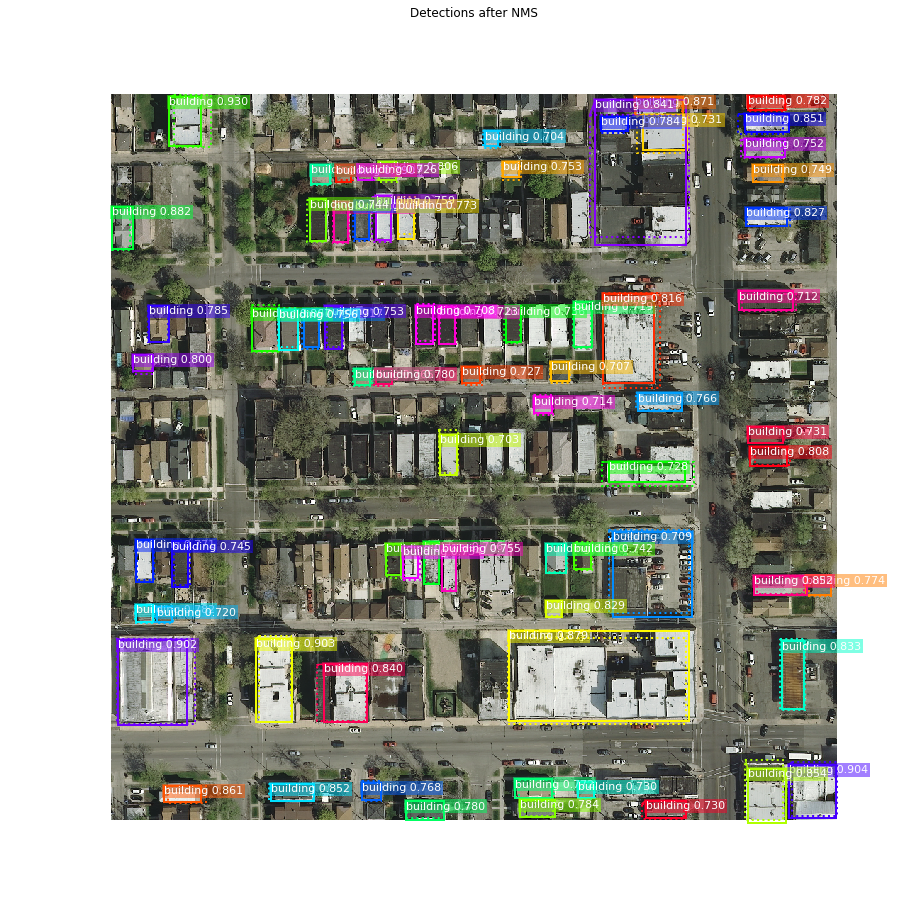

In [30]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

### 3.a Mask Targets

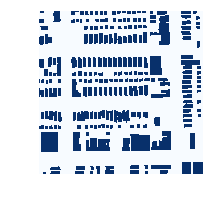

In [46]:
#display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")
# instead of displaying one image per instance, we display the full mask
display_images(np.transpose(np.sum(gt_mask,2,keepdims=True), [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [ ]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

In [79]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
#det_count = np.where(det_class_ids == 0)[0][0]
det_count = len(det_class_ids)
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

100 detections: ['building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' 'building' 'building'
 'building' 'building' 'building' 'building' '

In [90]:
mrcnn["detections"].astype(np.int32)

array([[[0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0,

In [92]:
# Masks
det_boxes = mrcnn["detections"][0, :, :4].astype(np.int32)
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

ValueError: height and width must be > 0

In [83]:
det_mask_specific

array([[[ 0.18564236,  0.18449056,  0.1825171 , ...,  0.11063801,
          0.11055051,  0.10330664],
        [ 0.18240875,  0.18865989,  0.18762591, ...,  0.11474732,
          0.10807077,  0.10685379],
        [ 0.20876171,  0.22675402,  0.2367067 , ...,  0.15137935,
          0.10896868,  0.10144957],
        ..., 
        [ 0.18777999,  0.19491318,  0.2081337 , ...,  0.14240746,
          0.09615003,  0.0943075 ],
        [ 0.16011693,  0.15662812,  0.13821052, ...,  0.09667014,
          0.0977038 ,  0.09446184],
        [ 0.1537521 ,  0.15092465,  0.12539512, ...,  0.08792528,
          0.09238922,  0.09245741]],

       [[ 0.18564236,  0.18449056,  0.1825171 , ...,  0.11063801,
          0.11055051,  0.10330664],
        [ 0.18240875,  0.18865989,  0.18762591, ...,  0.11474732,
          0.10807077,  0.10685379],
        [ 0.20876171,  0.22675402,  0.2367067 , ...,  0.15137935,
          0.10896868,  0.10144957],
        ..., 
        [ 0.18777999,  0.19491318,  0.2081337 , ...,

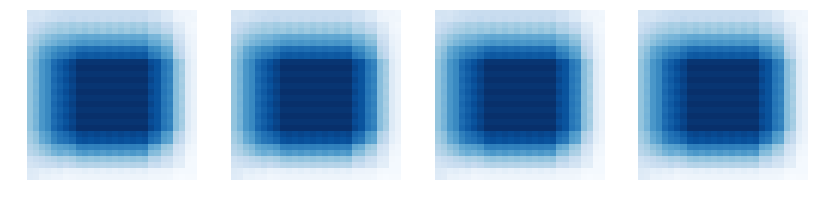

In [84]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

In [85]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

NameError: name 'det_masks' is not defined

In [54]:
test = np.ones(3)

In [55]:
test

array([ 1.,  1.,  1.])

In [64]:
np.where(test != 0)[0]

array([0, 1, 2])